In [277]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [278]:
# Global parameters
total_years = 20 # this will be calculated based on study start and end dates
# Adoption model differential eq Parameters
dt = 1#/12  # time step in years (monthly)
time = np.arange(0, total_years, dt)
n = len(time)

In [279]:
#Competition group and building type specific Inputs
# New Construction

#######################
### feature request ###
#######################

# # this code reads 30_Construction_Inputs.xlsx
# new_construction_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='New_Construction')
# demolition_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='Demolition')
# renovation_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='Renovation')

# #the dataframes renovation_inputs_df demolition_inputs_df new_construction_inputs_df are structured the same with the column competition group and subgroup and the other columns being the building type
# # this code will need to be modified to loop through competition groups and building types to get the correct values for each simulation
# # 
# 
# #In the code we will add a curve to predict what the new construction demolition and renovation will be over time but for now we will use a constant value
# nc_per_year = 10 #this value will be an input table from the characterizer #these need to be per competition group and building type
# nc = nc_per_year * dt 
# nc_arr = np.full(n, nc)  # Create an array for plotting this is the new construction per time step
# # initialize an array of cumulative annual totals for nc
# nc_cumulative_annual = np.zeros(n)
# nc = nc_per_year * dt 
# nc_arr = np.full(n, nc)
# nc_cumulative_annual = np.cumsum(nc_arr)

# # Demolition 
# demo_per_year = 10 #this value will be an input table from the characterizer
# demo = demo_per_year * dt 
# demo_arr = np.full(n, demo)  # Create an array for plotting this is the demo per time step
# # initialize an array of cumulative annual totals for nc
# demo_cumulative_annual = np.zeros(n)
# demo = demo_per_year * dt 
# demo_arr = np.full(n, demo)
# demo_cumulative_annual = np.cumsum(demo_arr)

# # Renovation
# reno_per_year = 10 #this value will be an input table from the characterizer
# reno = reno_per_year * dt 
# reno_arr = np.full(n, reno)  # Create an array for plotting this is the demo per time step
# # initialize an array of cumulative annual totals for nc
# reno_cumulative_annual = np.zeros(n)
# reno = reno_per_year * dt 
# reno_arr = np.full(n, reno)
# reno_cumulative_annual = np.cumsum(reno_arr)


In [280]:
#Competition group and building type specific Inputs
# New Construction

#######################
### feature request ###
#######################

# this code reads 30_Construction_Inputs.xlsx
new_construction_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='New_Construction')
demolition_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='Demolition')
renovation_inputs_df = pd.read_excel('./030_input/30_Construction_Inputs.xlsx', sheet_name='Renovation')

#the dataframes renovation_inputs_df demolition_inputs_df new_construction_inputs_df are structured the same with the column competition group and subgroup and the other columns being the building type
# this code will need to be modified to loop through competition groups and building types to get the correct values for each simulation

# Helper function to get the construction/demo/reno value from input dataframes
def get_construction_value(input_df, competition_group, building_type):
    """
    Get the construction/demolition/renovation value for a specific competition group and building type.
    
    Parameters:
    -----------
    input_df : pd.DataFrame
        The input dataframe (new_construction_inputs_df, demolition_inputs_df, or renovation_inputs_df)
    competition_group : str
        The competition group (e.g., 'refrigeration', 'whole_home')
    building_type : str
        The building type (e.g., 'multi_family', 'single_family', etc.)
    
    Returns:
    --------
    float
        The value per year for the specified competition group and building type
    """
    try:
        # Filter by competition group
        row = input_df[input_df['competition_group'] == competition_group]
        if row.empty:
            return 0.0
        # Get the value from the building_type column
        if building_type in row.columns:
            value = row[building_type].values[0]
            return float(value) if pd.notna(value) else 0.0
        else:
            return 0.0
    except Exception as e:
        print(f"Warning: Could not retrieve value for {competition_group}/{building_type}: {e}")
        return 0.0

In [281]:
# Initialize arrays
total_stock = np.zeros(n)
remaining_stock = np.zeros(n)
ret_er_stock = np.zeros(n)
rob_stock = np.zeros(n)
# Substocks within remaining_stock

remaining_below_baseline_stock = np.zeros(n)
remaining_baseline_stock = np.zeros(n)
remaining_efficient_stock = np.zeros(n)
remaining_top10_stock = np.zeros(n)

# Substocks within ret_er_stock
ret_er_below_baseline_stock = np.zeros(n)
ret_er_baseline_stock = np.zeros(n)
ret_er_efficient_stock = np.zeros(n)
ret_er_top10_stock = np.zeros(n)

# Substocks within rob_stock
rob_below_baseline_stock = np.zeros(n)
rob_baseline_stock = np.zeros(n)
rob_efficient_stock = np.zeros(n)
rob_top10_stock = np.zeros(n)


In [282]:
df = pd.read_pickle("./030_input/df_yrs.pkl")

#######################
### feature request ###
#######################
# Create competition allocation based on PCT test for efficient measures


# Define a function to extract the size
def extract_eff_level(description):
    if 'baseline' in description:
        return 'baseline'
    elif 'existing' in description:
        return 'existing'
    elif 'efficient' in description:
        return 'efficient'
    elif 'top10' in description:
        return 'top10' #this change is made because top10 is considered efficient in refrigeration for now just holding to get number right
    else:
        return 'Unknown'

# Apply the function to the 'Description' column to create the new 'Size' column
df['efficiency_level'] = df['condition_name'].apply(extract_eff_level)
df

,condition_name,competition_group,subgroup,electric_utility,gas_utility,building_type,measure_life_(yrs),initial_count,condition,market,...,SCT_cost,SCT_benefit,SCT_BCR,RIM_cost,RIM_benefit,RIM_BCR,PCT_cost,PCT_benefit,PCT_BCR,efficiency_level
0,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,test_utility_1,single_family,10.0,10000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
1,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,test_utility_2,single_family,10.0,20000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
2,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_2,test_utility_2,single_family,10.0,55000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
3,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,none,single_family,10.0,10000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
4,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_2,none,single_family,10.0,11000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1339,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_2,test_utility_2,multi_family_li,30.0,350.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1340,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_1,none,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1341,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_2,none,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1342,insulation_natural_gas_efficient_residential,whole_home,none,none,test_utility_1,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient


In [283]:
#these retirement rates will come from the condition input sheet for each condition (can they be unique to each condition?)
#is er and Add on a calculable value?
rob_retirement_rate = 1
ret_er_retirement_rate = 0.02
ret_add_on_retirement_rate = 0.00

In [284]:
#######################
### feature request ###
#######################
# Just screen out non cost effective measures (Have the bcr be an input that the user can change which bcr to use)


In [285]:
#######################
### feature request ### We need to make the number of substocks variable based on the count in the condition input sheet(workpapers)
#######################

def baseline_eq(Below_Baseline, Baseline, Efficient, Top10, m, retirement_rate, df_filtered=None):
    Tech_Value = 0 # this is 100 percent as that is the definition of technical potential
    Retirement_Flow = m * retirement_rate * dt #(m is the size of the stock)
    Top10_Flow  = Retirement_Flow * Tech_Value
    Efficient_Adoption_Flow = Retirement_Flow * (Tech_Value)
    Remaining_Flow = Retirement_Flow - Efficient_Adoption_Flow - Top10_Flow
    Baseline_Adoption_Flow = Remaining_Flow # should be zero as this is technical but left in for future
    Below_Baseline_Adoption_Flow = 0.0
    
    dEfficient_dt = Efficient_Adoption_Flow - (Efficient * retirement_rate* dt)
    dBaseline_dt = Baseline_Adoption_Flow - (Baseline * retirement_rate* dt)
    dBelow_Baseline_dt = Below_Baseline_Adoption_Flow - (Below_Baseline * retirement_rate* dt)
    dTop10_dt = Top10_Flow - (Top10 * retirement_rate* dt)
    
    return dBelow_Baseline_dt, dBaseline_dt, dEfficient_dt, dTop10_dt
    # the alternative for tech is code 
    # we care about savings that are generated so when moving to measure we already have the baseline built in
    

In [286]:
def tech_eq(Below_Baseline, Baseline, Efficient, Top10, m, retirement_rate, df_filtered=None):
    Tech_Value = 1 # this is 100 percent as that is the definition of technical potential
    Retirement_Flow = m * retirement_rate * dt #(m is the size of the stock)
    Top10_Flow  = Retirement_Flow * Tech_Value
    Efficient_Adoption_Flow = Retirement_Flow * (1 - Tech_Value)
    Remaining_Flow = Retirement_Flow - Efficient_Adoption_Flow - Top10_Flow
    Baseline_Adoption_Flow = Remaining_Flow # should be zero as this is technical but left in for future
    Below_Baseline_Adoption_Flow = 0.0
    
    dEfficient_dt = Efficient_Adoption_Flow - (Efficient * retirement_rate* dt)
    dBaseline_dt = Baseline_Adoption_Flow - (Baseline * retirement_rate* dt)
    dBelow_Baseline_dt = Below_Baseline_Adoption_Flow - (Below_Baseline * retirement_rate* dt)
    dTop10_dt = Top10_Flow - (Top10 * retirement_rate* dt)
    
    return dBelow_Baseline_dt, dBaseline_dt, dEfficient_dt, dTop10_dt
    # the alternative for tech is code 
    # we care about savings that are generated so when moving to measure we already have the baseline built in

In [287]:

df

,condition_name,competition_group,subgroup,electric_utility,gas_utility,building_type,measure_life_(yrs),initial_count,condition,market,...,SCT_cost,SCT_benefit,SCT_BCR,RIM_cost,RIM_benefit,RIM_BCR,PCT_cost,PCT_benefit,PCT_BCR,efficiency_level
0,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,test_utility_1,single_family,10.0,10000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
1,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,test_utility_2,single_family,10.0,20000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
2,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_2,test_utility_2,single_family,10.0,55000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
3,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_1,none,single_family,10.0,10000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
4,furnace_fuel_oil_existing_residential,heating_cooling,oil_furnace,test_utility_2,none,single_family,10.0,11000.0,furnace_fuel_oil_existing_residential,ROB,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,existing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1339,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_2,test_utility_2,multi_family_li,30.0,350.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1340,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_1,none,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1341,insulation_natural_gas_efficient_residential,whole_home,none,test_utility_2,none,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient
1342,insulation_natural_gas_efficient_residential,whole_home,none,none,test_utility_1,multi_family_li,30.0,125.0,insulation_natural_gas_efficient_residential,REMAINING,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,efficient


In [288]:
#######################
### feature request ###
#######################
# Have the pct dictate where things go after death
#also include the economic screening

# easiest way is to have the system be an if statemnet and have code for each of the different count of substocks as needed 

def competition_eq(Below_Baseline, Baseline, Efficient, Top10, m, retirement_rate, df_filtered=None):
    # Calculate Tech_Value based on PCT_BCR from top10 and efficient rows
    if df_filtered is not None and len(df_filtered) > 0:
        top10_bcr = df_filtered.loc[df_filtered['efficiency_level'] == 'top10', 'PCT_BCR'].sum()
        efficient_bcr = df_filtered.loc[df_filtered['efficiency_level'] == 'efficient', 'PCT_BCR'].sum()
        
        # Calculate Tech_Value: proportion of top10 BCR relative to total (top10 + efficient)
        total_bcr = top10_bcr + efficient_bcr
        if total_bcr > 0:
            Tech_Value = top10_bcr / total_bcr
        else:
            Tech_Value = 0.0
    else:
        Tech_Value = 0.0
    
    Retirement_Flow = m * retirement_rate * dt #(m is the size of the stock)
    Top10_Flow  = Retirement_Flow * Tech_Value
    Efficient_Adoption_Flow = Retirement_Flow * (1 - Tech_Value)
    Remaining_Flow = Retirement_Flow - Efficient_Adoption_Flow - Top10_Flow
    Baseline_Adoption_Flow = Remaining_Flow # should be zero as this is technical but left in for future
    Below_Baseline_Adoption_Flow = 0.0
    
    dEfficient_dt = Efficient_Adoption_Flow - (Efficient * retirement_rate* dt)
    dBaseline_dt = Baseline_Adoption_Flow - (Baseline * retirement_rate* dt)
    dBelow_Baseline_dt = Below_Baseline_Adoption_Flow - (Below_Baseline * retirement_rate* dt)
    dTop10_dt = Top10_Flow - (Top10 * retirement_rate* dt)
    
    return dBelow_Baseline_dt, dBaseline_dt, dEfficient_dt, dTop10_dt
    # the alternative for tech is code 
    # we care about savings that are generated so when moving to measure we already have the baseline built in

In [289]:
# def run_adoption_model(adoption_function, scenario_name='baseline'):
#     """
#     Run the adoption model with a specified adoption equation function.
    
#     Parameters:
#     -----------
#     adoption_function : callable
#         The function to use for adoption calculations (e.g., baseline_eq, tech_eq, economic_eq, competition_eq)
#     scenario_name : str
#         Name of the scenario for labeling results (default: 'baseline')
    
#     Returns:
#     --------
#     pd.DataFrame
#         Results dataframe with all stock calculations over time
#     """
#         #baseline version
#     competition_groups = ['refrigeration', 'whole_home']
#     #subgroup = ['none', 'full_size']
#     electric_utility = ['test_utility_1', 'none', 'test_utility_2']
#     gas_utility = ['test_utility_1', 'none', 'test_utility_2']
#     building_type = ['multi_family', 'single_family', 'multi_family_li', 'single_family_li']

#     results = []

#     for cg in competition_groups:
#         #for sg in subgroup:
#             for eu in electric_utility:
#                 for gu in gas_utility:
#                     for bt in building_type:
#                         df_filtered = df[
#                             (df['competition_group'] == cg) &
#                             #df['subgroup'] == sg) &
#                             (df['electric_utility'] == eu) &
#                             (df['gas_utility'] == gu) &
#                             (df['building_type'] == bt)
#                         ]
#                         # Initialize arrays for this group
#                         total_stock = np.zeros(n)
#                         remaining_stock = np.zeros(n)
#                         ret_er_stock = np.zeros(n)
#                         rob_stock = np.zeros(n)
#                         remaining_below_baseline_stock = np.zeros(n)
#                         remaining_baseline_stock = np.zeros(n)
#                         remaining_efficient_stock = np.zeros(n)
#                         ret_er_below_baseline_stock = np.zeros(n)
#                         ret_er_baseline_stock = np.zeros(n)
#                         ret_er_efficient_stock = np.zeros(n)
#                         rob_below_baseline_stock = np.zeros(n)
#                         rob_baseline_stock = np.zeros(n)
#                         rob_efficient_stock = np.zeros(n)
#                         remaining_top10_stock = np.zeros(n)
#                         ret_er_top10_stock = np.zeros(n)
#                         rob_top10_stock = np.zeros(n)
#                         # Set initial conditions for t=0
#                         # total_stock[0] = df_filtered['count'].sum() # had extra due to Ret Add ON
#                         ret_er_stock[0] = df_filtered.loc[df_filtered['market'] == 'RET_ER', 'count'].sum()
#                         remaining_stock[0] = df_filtered.loc[df_filtered['market'] == 'REMAINING', 'count'].sum()
#                         rob_stock[0] = df_filtered.loc[df_filtered['market'] == 'ROB', 'count'].sum()

#                         #to address the possibility of multiple efficient measures we are creating a sub stock called top10 and that gets added into efficient stock for tech

#                         remaining_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
#                         remaining_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
#                         remaining_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
#                         remaining_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()

#                         ret_er_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
#                         ret_er_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
#                         ret_er_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
#                         ret_er_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()

#                         rob_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
#                         rob_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
#                         rob_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
#                         rob_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()
                        
#                         # ret_er_stock[0] = ret_er_below_baseline_stock[0] + ret_er_baseline_stock[0] + ret_er_efficient_stock[0] + ret_er_top10_stock[0]
#                         # rob_stock[0] = rob_below_baseline_stock[0] + rob_baseline_stock[0] + rob_efficient_stock[0] + rob_top10_stock[0]
#                         # remaining_stock[0] = remaining_below_baseline_stock[0] + remaining_baseline_stock[0] + remaining_efficient_stock[0] + remaining_top10_stock[0]
#                         total_stock[0] = ret_er_stock[0] + rob_stock[0] + remaining_stock[0]
                        
#                         for t in range(1, n):
#                             # Add new construction to total stock
#                             total_stock[t] = total_stock[t-1] + nc - demo 
#                             # --- Apply Tech to Early RETROFIT MARKET ---
#                             dBB_ret_er, dB_ret_er, dE_ret_er, dT_ret_er = adoption_function(
#                                 ret_er_below_baseline_stock[t-1],
#                                 ret_er_baseline_stock[t-1],
#                                 ret_er_efficient_stock[t-1],
#                                 ret_er_top10_stock[t-1],
#                                 ret_er_stock[t-1],
#                                 ret_er_retirement_rate,
#                                 df_filtered  
#                             )
#                             temp_ret_er_below_baseline = max(ret_er_below_baseline_stock[t-1] + dBB_ret_er * dt, 0.0)
#                             temp_ret_er_baseline = max(ret_er_baseline_stock[t-1] + dB_ret_er * dt, 0.0)
#                             temp_ret_er_efficient = max(ret_er_efficient_stock[t-1] + dE_ret_er * dt, 0.0)
#                             temp_ret_er_top10 = max(ret_er_top10_stock[t-1] + dT_ret_er * dt, 0.0)
#                             # --- Apply Tech to MARKET DRIVEN MARKET ---
#                             dBB_rob, dB_rob, dE_rob, dT_rob = adoption_function(
#                                 rob_below_baseline_stock[t-1],
#                                 rob_baseline_stock[t-1],
#                                 rob_efficient_stock[t-1],
#                                 rob_top10_stock[t-1],
#                                 rob_stock[t-1],
#                                 rob_retirement_rate,
#                                 df_filtered
#                             )
#                             temp_rob_below_baseline = max(rob_below_baseline_stock[t-1] + dBB_rob * dt, 0.0)
#                             temp_rob_baseline = max(rob_baseline_stock[t-1] + dB_rob * dt, 0.0)
#                             temp_rob_efficient = max(rob_efficient_stock[t-1] + dE_rob * dt, 0.0)
#                             temp_rob_top10 = max(rob_top10_stock[t-1] + dT_rob * dt, 0.0)

#                             # --- Apply Tech to REMAINING MARKET ---
#                             dBB_rem, dB_rem, dE_rem, dT_rem = adoption_function(
#                                 remaining_below_baseline_stock[t-1],
#                                 remaining_baseline_stock[t-1],
#                                 remaining_efficient_stock[t-1],
#                                 remaining_top10_stock[t-1],
#                                 remaining_stock[t-1],
#                                 ret_add_on_retirement_rate,
#                                 df_filtered
#                             )
#                             temp_ret_add_on_below_baseline = max(remaining_below_baseline_stock[t-1] + dBB_rem * dt, 0.0)
#                             temp_ret_add_on_baseline = max(remaining_baseline_stock[t-1] + dB_rem * dt, 0.0)
#                             temp_ret_add_on_efficient = max(remaining_efficient_stock[t-1] + dE_rem * dt, 0.0)
#                             temp_ret_add_on_top10 = max(remaining_top10_stock[t-1] + dT_rem * dt, 0.0)
#                             # --- Apply Tech to the older part of Retrofit add on group ---
#                             dBB_ret_add_on_2, dB_ret_add_on_2, dE_ret_add_on_2, dT_ret_add_on_2 = adoption_function(
#                                 ret_er_below_baseline_stock[t-1],
#                                 ret_er_baseline_stock[t-1],
#                                 ret_er_efficient_stock[t-1],
#                                 ret_er_top10_stock[t-1],
#                                 ret_er_stock[t-1],
#                                 ret_add_on_retirement_rate,
#                                 df_filtered
#                             )
#                             temp_ret_add_on_2_below_baseline = ret_er_below_baseline_stock[t-1] - max(ret_er_below_baseline_stock[t-1] + dBB_ret_add_on_2 * dt, 0.0)
#                             temp_ret_add_on_2_baseline = ret_er_baseline_stock[t-1] - max(ret_er_baseline_stock[t-1] + dB_ret_add_on_2 * dt, 0.0)
#                             temp_ret_add_on_2_efficient = ret_er_efficient_stock[t-1] - max(ret_er_efficient_stock[t-1] + dE_ret_add_on_2 * dt, 0.0)
#                             temp_ret_add_on_2_top10 = ret_er_top10_stock[t-1] - max(ret_er_top10_stock[t-1] + dT_ret_add_on_2 * dt, 0.0)

#                             # --- Move stocks between markets ---
#                             new_rob_below_baseline_stock = temp_ret_er_below_baseline * (1/3)
#                             new_ret_er_below_baseline_stock = temp_ret_er_below_baseline * (2/3) + temp_ret_add_on_below_baseline * (1/6)
#                             new_remaining_below_baseline_stock = temp_ret_add_on_below_baseline * (5/6) + temp_rob_below_baseline + temp_ret_add_on_2_below_baseline
#                             new_rob_baseline_stock = temp_ret_er_baseline * (1/3)
#                             new_ret_er_baseline_stock = temp_ret_er_baseline * (2/3) + temp_ret_add_on_baseline * (1/6)
#                             new_remaining_baseline_stock = temp_ret_add_on_baseline * (5/6) + temp_rob_baseline + temp_ret_add_on_2_baseline
#                             new_rob_efficient_stock = temp_ret_er_efficient * (1/3)
#                             new_ret_er_efficient_stock = temp_ret_er_efficient * (2/3) + temp_ret_add_on_efficient * (1/6)
#                             new_remaining_efficient_stock = temp_ret_add_on_efficient * (5/6) + temp_rob_efficient + temp_ret_add_on_2_efficient
                            
#                             new_rob_top10_stock = temp_ret_er_top10 * (1/3)
#                             new_ret_er_top10_stock = temp_ret_er_top10 * (2/3) + temp_ret_add_on_top10 * (1/6)
#                             new_remaining_top10_stock = temp_ret_add_on_top10 * (5/6) + temp_rob_top10 + temp_ret_add_on_2_top10
                            

#                             # --- Add new construction Demo and Reno to ret_stock substocks ---
#                             denom_rem = new_remaining_baseline_stock + new_remaining_efficient_stock + new_remaining_below_baseline_stock + new_remaining_top10_stock
#                             if denom_rem != 0: #had to add due to incomplete data
#                                 remaining_below_baseline_stock[t] = new_remaining_below_baseline_stock + (nc * 0) - (reno *(6/10)* new_remaining_below_baseline_stock/denom_rem)
#                                 remaining_baseline_stock[t] = new_remaining_baseline_stock + (nc * (1/3)) - (reno *(6/10)*  new_remaining_baseline_stock/denom_rem)
#                                 remaining_efficient_stock[t] = new_remaining_efficient_stock + (nc * (1/3)) - (reno * (6/10) * new_remaining_efficient_stock/denom_rem) + (reno * (6/10))
#                                 #will need to allocate NC based on Equation later
#                                 remaining_top10_stock[t] = new_remaining_top10_stock + (nc * (1/3)) - (reno * (6/10) * new_remaining_top10_stock/denom_rem)
#                             else:
#                                 remaining_below_baseline_stock[t] = new_remaining_below_baseline_stock
#                                 remaining_baseline_stock[t] = new_remaining_baseline_stock
#                                 remaining_efficient_stock[t] = new_remaining_efficient_stock
#                                 remaining_top10_stock[t] = new_remaining_top10_stock

#                             denom_ret_er = new_ret_er_baseline_stock + new_ret_er_efficient_stock + new_ret_er_below_baseline_stock + new_ret_er_top10_stock
#                             if denom_ret_er != 0:
#                                 ret_er_below_baseline_stock[t] = new_ret_er_below_baseline_stock - (demo * (1/4)) - (reno *(3/10)* new_ret_er_below_baseline_stock/denom_ret_er)
#                                 ret_er_baseline_stock[t] = new_ret_er_baseline_stock - (demo * (1/4)) - (reno *(3/10)* new_ret_er_baseline_stock/denom_ret_er)
#                                 ret_er_efficient_stock[t] = new_ret_er_efficient_stock - (demo * (1/4)) - (reno * (3/10) * new_ret_er_efficient_stock/denom_ret_er) + (reno * (3/10))
#                                 ret_er_top10_stock[t] = new_ret_er_top10_stock - (demo * (1/4)) - (reno * (3/10) * new_ret_er_top10_stock/denom_ret_er) + (reno * (3/10))
#                             else:
#                                 ret_er_below_baseline_stock[t] = new_ret_er_below_baseline_stock
#                                 ret_er_baseline_stock[t] = new_ret_er_baseline_stock
#                                 ret_er_efficient_stock[t] = new_ret_er_efficient_stock
#                                 ret_er_top10_stock[t] = new_ret_er_top10_stock

#                             denom_rob = new_rob_baseline_stock + new_rob_efficient_stock + new_rob_below_baseline_stock + new_rob_top10_stock
#                             if denom_rob != 0:
#                                 rob_below_baseline_stock[t] = new_rob_below_baseline_stock - (reno *(1/10)* new_rob_below_baseline_stock/denom_rob)
#                                 rob_baseline_stock[t] = new_rob_baseline_stock - (reno *(1/10)* new_rob_baseline_stock/denom_rob)
#                                 rob_efficient_stock[t] = new_rob_efficient_stock - (reno * (1/10)* new_rob_efficient_stock/denom_rob) + (reno * (1/10))
#                                 rob_top10_stock[t] = new_rob_top10_stock - (reno * (1/10)* new_rob_top10_stock/denom_rob) + (reno * (1/10))
#                             else:
#                                 rob_below_baseline_stock[t] = new_rob_below_baseline_stock
#                                 rob_baseline_stock[t] = new_rob_baseline_stock
#                                 rob_efficient_stock[t] = new_rob_efficient_stock
#                                 rob_top10_stock[t] = new_rob_top10_stock
#                             # --- Update market totals ---
#                             ret_er_stock[t] = ret_er_below_baseline_stock[t] + ret_er_baseline_stock[t] + ret_er_efficient_stock[t] + ret_er_top10_stock[t]
#                             rob_stock[t] = rob_below_baseline_stock[t] + rob_baseline_stock[t] + rob_efficient_stock[t] + rob_top10_stock[t]
#                             remaining_stock[t] = remaining_below_baseline_stock[t] + remaining_baseline_stock[t] + remaining_efficient_stock[t] + remaining_top10_stock[t]
#                             total_stock[t] = rob_stock[t] + ret_er_stock[t] + remaining_stock[t]
#                         # Append a row for each time step
#                         for t in range(n):
#                             results.append({
#                                 'competition_group': cg,
#                                 #'subgroup': sg,
#                                 'electric_utility': eu,
#                                 'gas_utility': gu,
#                                 'building_type': bt,
#                                 'time': t * dt,
#                                 'total_stock': total_stock[t],
#                                 'ret_er_stock': ret_er_stock[t],
#                                 'remaining_stock': remaining_stock[t],
#                                 'rob_stock': rob_stock[t],
#                                 'remaining_below_baseline_stock': remaining_below_baseline_stock[t],
#                                 'remaining_baseline_stock': remaining_baseline_stock[t],
#                                 'remaining_efficient_stock': remaining_efficient_stock[t],
#                                 'remaining_top10_stock': remaining_top10_stock[t],
#                                 'ret_er_below_baseline_stock': ret_er_below_baseline_stock[t],
#                                 'ret_er_baseline_stock': ret_er_baseline_stock[t],
#                                 'ret_er_efficient_stock': ret_er_efficient_stock[t],
#                                 'ret_er_top10_stock': ret_er_top10_stock[t],
#                                 'rob_below_baseline_stock': rob_below_baseline_stock[t],
#                                 'rob_baseline_stock': rob_baseline_stock[t],
#                                 'rob_efficient_stock': rob_efficient_stock[t],
#                                 'rob_top10_stock': rob_top10_stock[t]
#                             })

#     return pd.DataFrame(results)




In [295]:
def run_adoption_model(adoption_function, scenario_name='baseline'):
    """
    Run the adoption model with a specified adoption equation function.
    
    Parameters:
    -----------
    adoption_function : callable
        The function to use for adoption calculations (e.g., baseline_eq, tech_eq, economic_eq, competition_eq)
    scenario_name : str
        Name of the scenario for labeling results (default: 'baseline')
    
    Returns:
    --------
    pd.DataFrame
        Results dataframe with all stock calculations over time
    """
    #baseline version
    competition_groups = ['refrigeration', 'whole_home']
    #subgroup = ['none', 'full_size']
    electric_utility = ['test_utility_1', 'none', 'test_utility_2']
    gas_utility = ['test_utility_1', 'none', 'test_utility_2']
    building_type = ['multi_family', 'single_family', 'multi_family_li', 'single_family_li']

    results = []

    for cg in competition_groups:
        #for sg in subgroup:
            for eu in electric_utility:
                for gu in gas_utility:
                    for bt in building_type:
                        # Get dynamic nc, demo, and reno values based on competition group and building type
                        nc_per_year = get_construction_value(new_construction_inputs_df, cg, bt)
                        demo_per_year = get_construction_value(demolition_inputs_df, cg, bt)
                        reno_per_year = get_construction_value(renovation_inputs_df, cg, bt)
                        
                        # Calculate per-timestep values
                        nc = nc_per_year * dt
                        demo = demo_per_year * dt
                        reno = reno_per_year * dt
                        
                        df_filtered = df[
                            (df['competition_group'] == cg) &
                            #df['subgroup'] == sg) &
                            (df['electric_utility'] == eu) &
                            (df['gas_utility'] == gu) &
                            (df['building_type'] == bt)
                        ]
                        # Initialize arrays for this group
                        total_stock = np.zeros(n)
                        remaining_stock = np.zeros(n)
                        ret_er_stock = np.zeros(n)
                        rob_stock = np.zeros(n)
                        remaining_below_baseline_stock = np.zeros(n)
                        remaining_baseline_stock = np.zeros(n)
                        remaining_efficient_stock = np.zeros(n)
                        ret_er_below_baseline_stock = np.zeros(n)
                        ret_er_baseline_stock = np.zeros(n)
                        ret_er_efficient_stock = np.zeros(n)
                        rob_below_baseline_stock = np.zeros(n)
                        rob_baseline_stock = np.zeros(n)
                        rob_efficient_stock = np.zeros(n)
                        remaining_top10_stock = np.zeros(n)
                        ret_er_top10_stock = np.zeros(n)
                        rob_top10_stock = np.zeros(n)
# Initialize flow tracking arrays
                        ret_er_below_baseline_flow = np.zeros(n)
                        ret_er_baseline_flow = np.zeros(n)
                        ret_er_efficient_flow = np.zeros(n)
                        ret_er_top10_flow = np.zeros(n)
                        rob_below_baseline_flow = np.zeros(n)
                        rob_baseline_flow = np.zeros(n)
                        rob_efficient_flow = np.zeros(n)
                        rob_top10_flow = np.zeros(n)
                        remaining_below_baseline_flow = np.zeros(n)
                        remaining_baseline_flow = np.zeros(n)
                        remaining_efficient_flow = np.zeros(n)
                        remaining_top10_flow = np.zeros(n)
                        remaining_below_baseline_flow_2 = np.zeros(n)
                        remaining_baseline_flow_2 = np.zeros(n)
                        remaining_efficient_flow_2 = np.zeros(n)
                        remaining_top10_flow_2 = np.zeros(n)
                        # Set initial conditions for t=0
                        # total_stock[0] = df_filtered['count'].sum() # had extra due to Ret Add ON
                        ret_er_stock[0] = df_filtered.loc[df_filtered['market'] == 'RET_ER', 'count'].sum()
                        remaining_stock[0] = df_filtered.loc[df_filtered['market'] == 'REMAINING', 'count'].sum()
                        rob_stock[0] = df_filtered.loc[df_filtered['market'] == 'ROB', 'count'].sum()

                        #to address the possibility of multiple efficient measures we are creating a sub stock called top10 and that gets added into efficient stock for tech

                        remaining_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
                        remaining_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
                        remaining_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
                        remaining_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'REMAINING') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()

                        ret_er_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
                        ret_er_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
                        ret_er_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
                        ret_er_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'RET_ER') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()

                        rob_below_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'existing'), 'count'].sum()
                        rob_baseline_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'baseline'), 'count'].sum()
                        rob_efficient_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'efficient'), 'count'].sum()
                        rob_top10_stock[0] = df_filtered.loc[(df_filtered['market'] == 'ROB') & (df_filtered['efficiency_level'] == 'top10'), 'count'].sum()
                        
                        # ret_er_stock[0] = ret_er_below_baseline_stock[0] + ret_er_baseline_stock[0] + ret_er_efficient_stock[0] + ret_er_top10_stock[0]
                        # rob_stock[0] = rob_below_baseline_stock[0] + rob_baseline_stock[0] + rob_efficient_stock[0] + rob_top10_stock[0]
                        # remaining_stock[0] = remaining_below_baseline_stock[0] + remaining_baseline_stock[0] + remaining_efficient_stock[0] + remaining_top10_stock[0]
                        total_stock[0] = ret_er_stock[0] + rob_stock[0] + remaining_stock[0]
                        
                        for t in range(1, n):
                            # Add new construction to total stock
                            #total_stock[t] = total_stock[t-1] + nc - demo removed
                            # --- Apply Tech to Early RETROFIT MARKET ---
                            dBB_ret_er, dB_ret_er, dE_ret_er, dT_ret_er = adoption_function(
                                ret_er_below_baseline_stock[t-1],
                                ret_er_baseline_stock[t-1],
                                ret_er_efficient_stock[t-1],
                                ret_er_top10_stock[t-1],
                                ret_er_stock[t-1],
                                ret_er_retirement_rate,
                                df_filtered  
                            )
                            temp_ret_er_below_baseline = max(ret_er_below_baseline_stock[t-1] + dBB_ret_er * dt, 0.0)
                            temp_ret_er_baseline = max(ret_er_baseline_stock[t-1] + dB_ret_er * dt, 0.0)
                            temp_ret_er_efficient = max(ret_er_efficient_stock[t-1] + dE_ret_er * dt, 0.0)
                            temp_ret_er_top10 = max(ret_er_top10_stock[t-1] + dT_ret_er * dt, 0.0)

                            
# Track retirement flows for ret_er market
                            ret_er_below_baseline_flow[t] = ret_er_below_baseline_stock[t-1] - temp_ret_er_below_baseline
                            ret_er_baseline_flow[t] = ret_er_baseline_stock[t-1] - temp_ret_er_baseline
                            ret_er_efficient_flow[t] = ret_er_efficient_stock[t-1] - temp_ret_er_efficient
                            ret_er_top10_flow[t] = ret_er_top10_stock[t-1] - temp_ret_er_top10
                            # --- Apply Tech to MARKET DRIVEN MARKET ---
                            dBB_rob, dB_rob, dE_rob, dT_rob = adoption_function(
                                rob_below_baseline_stock[t-1],
                                rob_baseline_stock[t-1],
                                rob_efficient_stock[t-1],
                                rob_top10_stock[t-1],
                                rob_stock[t-1],
                                rob_retirement_rate,
                                df_filtered
                            )
                            temp_rob_below_baseline = max(rob_below_baseline_stock[t-1] + dBB_rob * dt, 0.0)
                            temp_rob_baseline = max(rob_baseline_stock[t-1] + dB_rob * dt, 0.0)
                            temp_rob_efficient = max(rob_efficient_stock[t-1] + dE_rob * dt, 0.0)
                            temp_rob_top10 = max(rob_top10_stock[t-1] + dT_rob * dt, 0.0)
# Track retirement flows for rob market
                            rob_below_baseline_flow[t] = rob_below_baseline_stock[t-1] - temp_rob_below_baseline
                            rob_baseline_flow[t] = rob_baseline_stock[t-1] - temp_rob_baseline
                            rob_efficient_flow[t] = rob_efficient_stock[t-1] - temp_rob_efficient
                            rob_top10_flow[t] = rob_top10_stock[t-1] - temp_rob_top10
                            # --- Apply Tech to REMAINING MARKET ---
                            dBB_rem, dB_rem, dE_rem, dT_rem = adoption_function(
                                remaining_below_baseline_stock[t-1],
                                remaining_baseline_stock[t-1],
                                remaining_efficient_stock[t-1],
                                remaining_top10_stock[t-1],
                                remaining_stock[t-1],
                                ret_add_on_retirement_rate,
                                df_filtered
                            )
                            temp_ret_add_on_below_baseline = max(remaining_below_baseline_stock[t-1] + dBB_rem * dt, 0.0)
                            temp_ret_add_on_baseline = max(remaining_baseline_stock[t-1] + dB_rem * dt, 0.0)
                            temp_ret_add_on_efficient = max(remaining_efficient_stock[t-1] + dE_rem * dt, 0.0)
                            temp_ret_add_on_top10 = max(remaining_top10_stock[t-1] + dT_rem * dt, 0.0)

                            
# Track retirement flows for remaining market
                            remaining_below_baseline_flow[t] = remaining_below_baseline_stock[t-1] - temp_ret_add_on_below_baseline
                            remaining_baseline_flow[t] = remaining_baseline_stock[t-1] - temp_ret_add_on_baseline
                            remaining_efficient_flow[t] = remaining_efficient_stock[t-1] - temp_ret_add_on_efficient
                            remaining_top10_flow[t] = remaining_top10_stock[t-1] - temp_ret_add_on_top10
                            # --- Apply Tech to the older part of Retrofit add on group ---
                            dBB_ret_add_on_2, dB_ret_add_on_2, dE_ret_add_on_2, dT_ret_add_on_2 = adoption_function(
                                ret_er_below_baseline_stock[t-1],
                                ret_er_baseline_stock[t-1],
                                ret_er_efficient_stock[t-1],
                                ret_er_top10_stock[t-1],
                                ret_er_stock[t-1],
                                ret_add_on_retirement_rate,
                                df_filtered
                            )
                            temp_ret_add_on_2_below_baseline = ret_er_below_baseline_stock[t-1] - max(ret_er_below_baseline_stock[t-1] + dBB_ret_add_on_2 * dt, 0.0)
                            temp_ret_add_on_2_baseline = ret_er_baseline_stock[t-1] - max(ret_er_baseline_stock[t-1] + dB_ret_add_on_2 * dt, 0.0)
                            temp_ret_add_on_2_efficient = ret_er_efficient_stock[t-1] - max(ret_er_efficient_stock[t-1] + dE_ret_add_on_2 * dt, 0.0)
                            temp_ret_add_on_2_top10 = ret_er_top10_stock[t-1] - max(ret_er_top10_stock[t-1] + dT_ret_add_on_2 * dt, 0.0)
# Track retirement flows for remaining market
                            remaining_below_baseline_flow_2[t] = remaining_below_baseline_stock[t-1] - temp_ret_add_on_below_baseline
                            remaining_baseline_flow_2[t] = remaining_baseline_stock[t-1] - temp_ret_add_on_baseline
                            remaining_efficient_flow_2[t] = remaining_efficient_stock[t-1] - temp_ret_add_on_efficient
                            remaining_top10_flow_2[t] = remaining_top10_stock[t-1] - temp_ret_add_on_top10
                            # --- Move stocks between markets ---
                            new_rob_below_baseline_stock = temp_ret_er_below_baseline * (1/3)
                            new_ret_er_below_baseline_stock = temp_ret_er_below_baseline * (2/3) + temp_ret_add_on_below_baseline * (1/6)
                            new_remaining_below_baseline_stock = temp_ret_add_on_below_baseline * (5/6) + temp_rob_below_baseline + temp_ret_add_on_2_below_baseline
                            new_rob_baseline_stock = temp_ret_er_baseline * (1/3)
                            new_ret_er_baseline_stock = temp_ret_er_baseline * (2/3) + temp_ret_add_on_baseline * (1/6)
                            new_remaining_baseline_stock = temp_ret_add_on_baseline * (5/6) + temp_rob_baseline + temp_ret_add_on_2_baseline
                            new_rob_efficient_stock = temp_ret_er_efficient * (1/3)
                            new_ret_er_efficient_stock = temp_ret_er_efficient * (2/3) + temp_ret_add_on_efficient * (1/6)
                            new_remaining_efficient_stock = temp_ret_add_on_efficient * (5/6) + temp_rob_efficient + temp_ret_add_on_2_efficient
                            
                            new_rob_top10_stock = temp_ret_er_top10 * (1/3)
                            new_ret_er_top10_stock = temp_ret_er_top10 * (2/3) + temp_ret_add_on_top10 * (1/6)
                            new_remaining_top10_stock = temp_ret_add_on_top10 * (5/6) + temp_rob_top10 + temp_ret_add_on_2_top10
                            

                            # --- Add new construction Demo and Reno to ret_stock substocks ---
                            denom_rem = new_remaining_baseline_stock + new_remaining_efficient_stock + new_remaining_below_baseline_stock + new_remaining_top10_stock
                            if denom_rem != 0: #had to add due to incomplete data
                                # for reno we need to take out evenly from all stocks then add back in to top 10 if this is tech or 
                                # for renovation we are taking out 3x what ever is inputted on the sheet that is why we divided reno by 3
                                remaining_below_baseline_stock[t] = new_remaining_below_baseline_stock + (nc * 0) - (reno/3 * new_remaining_below_baseline_stock/denom_rem)
                                remaining_baseline_stock[t] = new_remaining_baseline_stock + (nc * (1/3)) - (reno/3  *  new_remaining_baseline_stock/denom_rem)
                                remaining_efficient_stock[t] = new_remaining_efficient_stock + (nc * (1/3)) - (reno/3  * new_remaining_efficient_stock/denom_rem) 
                                # Reno is currently assuming the best upgrade is preformed...
                                remaining_top10_stock[t] = new_remaining_top10_stock + (nc * (1/3)) - (reno/3 * new_remaining_top10_stock/denom_rem) + (reno * (6/10))
                            else:
                                remaining_below_baseline_stock[t] = new_remaining_below_baseline_stock
                                remaining_baseline_stock[t] = new_remaining_baseline_stock
                                remaining_efficient_stock[t] = new_remaining_efficient_stock
                                remaining_top10_stock[t] = new_remaining_top10_stock

                            denom_ret_er = new_ret_er_baseline_stock + new_ret_er_efficient_stock + new_ret_er_below_baseline_stock + new_ret_er_top10_stock
                            if denom_ret_er != 0:
                                ret_er_below_baseline_stock[t] = new_ret_er_below_baseline_stock - (demo * (1/4)) - (reno/3 * new_ret_er_below_baseline_stock/denom_ret_er)
                                ret_er_baseline_stock[t] = new_ret_er_baseline_stock - (demo * (1/4)) - (reno/3 * new_ret_er_baseline_stock/denom_ret_er)
                                ret_er_efficient_stock[t] = new_ret_er_efficient_stock - (demo * (1/4)) - (reno/3 * new_ret_er_efficient_stock/denom_ret_er)
                                ret_er_top10_stock[t] = new_ret_er_top10_stock - (demo * (1/4)) - (reno/3 * new_ret_er_top10_stock/denom_ret_er) + (reno * (3/10))
                            else:
                                ret_er_below_baseline_stock[t] = new_ret_er_below_baseline_stock
                                ret_er_baseline_stock[t] = new_ret_er_baseline_stock
                                ret_er_efficient_stock[t] = new_ret_er_efficient_stock
                                ret_er_top10_stock[t] = new_ret_er_top10_stock

                            denom_rob = new_rob_baseline_stock + new_rob_efficient_stock + new_rob_below_baseline_stock + new_rob_top10_stock
                            if denom_rob != 0:
                                #renovation can happen at any time
                                rob_below_baseline_stock[t] = new_rob_below_baseline_stock - (reno/3 * new_rob_below_baseline_stock/denom_rob)
                                rob_baseline_stock[t] = new_rob_baseline_stock - (reno/3 * new_rob_baseline_stock/denom_rob)
                                rob_efficient_stock[t] = new_rob_efficient_stock - (reno/3 * new_rob_efficient_stock/denom_rob) 
                                rob_top10_stock[t] = new_rob_top10_stock - (reno/3 * new_rob_top10_stock/denom_rob) + (reno * (1/10))
                            else:
                                rob_below_baseline_stock[t] = new_rob_below_baseline_stock
                                rob_baseline_stock[t] = new_rob_baseline_stock
                                rob_efficient_stock[t] = new_rob_efficient_stock
                                rob_top10_stock[t] = new_rob_top10_stock
                            # --- Update market totals ---
                            ret_er_stock[t] = ret_er_below_baseline_stock[t] + ret_er_baseline_stock[t] + ret_er_efficient_stock[t] + ret_er_top10_stock[t]
                            rob_stock[t] = rob_below_baseline_stock[t] + rob_baseline_stock[t] + rob_efficient_stock[t] + rob_top10_stock[t]
                            remaining_stock[t] = remaining_below_baseline_stock[t] + remaining_baseline_stock[t] + remaining_efficient_stock[t] + remaining_top10_stock[t]
                            total_stock[t] = rob_stock[t] + ret_er_stock[t] + remaining_stock[t]
                        # Append a row for each time step
                        for t in range(n):
                            results.append({
                                'competition_group': cg,
                                #'subgroup': sg,
                                'electric_utility': eu,
                                'gas_utility': gu,
                                'building_type': bt,
                                'time': t * dt,
                                'total_stock': total_stock[t],
                                'ret_er_stock': ret_er_stock[t],
                                'remaining_stock': remaining_stock[t],
                                'rob_stock': rob_stock[t],
                                'remaining_below_baseline_stock': remaining_below_baseline_stock[t],
                                'remaining_baseline_stock': remaining_baseline_stock[t],
                                'remaining_efficient_stock': remaining_efficient_stock[t],
                                'remaining_top10_stock': remaining_top10_stock[t],
                                'ret_er_below_baseline_stock': ret_er_below_baseline_stock[t],
                                'ret_er_baseline_stock': ret_er_baseline_stock[t],
                                'ret_er_efficient_stock': ret_er_efficient_stock[t],
                                'ret_er_top10_stock': ret_er_top10_stock[t],
                                'rob_below_baseline_stock': rob_below_baseline_stock[t],
                                'rob_baseline_stock': rob_baseline_stock[t],
                                'rob_efficient_stock': rob_efficient_stock[t],
                                'rob_top10_stock': rob_top10_stock[t],
                                        # Add flow columns
                                'ret_er_below_baseline_flow': ret_er_below_baseline_flow[t],
                                'ret_er_baseline_flow': ret_er_baseline_flow[t],
                                'ret_er_efficient_flow': ret_er_efficient_flow[t],
                                'ret_er_top10_flow': ret_er_top10_flow[t],
                                'rob_below_baseline_flow': rob_below_baseline_flow[t],
                                'rob_baseline_flow': rob_baseline_flow[t],
                                'rob_efficient_flow': rob_efficient_flow[t],
                                'rob_top10_flow': rob_top10_flow[t],
                                'remaining_below_baseline_flow': remaining_below_baseline_flow[t],
                                'remaining_baseline_flow': remaining_baseline_flow[t],
                                'remaining_efficient_flow': remaining_efficient_flow[t],
                                'remaining_top10_flow': remaining_top10_flow[t],
                                'remaining_baseline_flow_2': remaining_baseline_flow_2[t],
                                'remaining_efficient_flow_2': remaining_efficient_flow_2[t],
                                'remaining_top10_flow_2': remaining_top10_flow_2[t]
                                                    })

    return pd.DataFrame(results)

In [296]:
# Run both scenarios
baseline_results_df = run_adoption_model(baseline_eq, 'baseline')
tech_results_df = run_adoption_model(tech_eq, 'tech')
competition_results_df = run_adoption_model(competition_eq, 'competition')



In [297]:
# Save results
tech_results_df.to_pickle("030_output/tech_adoption_results.pkl")
baseline_results_df.to_pickle("030_output/baseline_adoption_results.pkl")
competition_results_df.to_pickle("030_output/competition_adoption_results.pkl")
tech_results_df.to_pickle("040_input/tech_adoption_results.pkl")
baseline_results_df.to_pickle("040_input/baseline_adoption_results.pkl")
competition_results_df.to_pickle("040_input/competition_adoption_results.pkl")
tech_results_df.to_csv("030_output/tech_adoption_results.csv")
baseline_results_df.to_csv("030_output/baseline_adoption_results.csv")
competition_results_df.to_csv("030_output/competition_adoption_results.csv")
# Display baseline results
baseline_results_df

,competition_group,electric_utility,gas_utility,building_type,time,total_stock,ret_er_stock,remaining_stock,rob_stock,remaining_below_baseline_stock,...,rob_baseline_flow,rob_efficient_flow,rob_top10_flow,remaining_below_baseline_flow,remaining_baseline_flow,remaining_efficient_flow,remaining_top10_flow,remaining_baseline_flow_2,remaining_efficient_flow_2,remaining_top10_flow_2
0,refrigeration,test_utility_1,test_utility_1,multi_family,0,6000.0,1800.000000,3600.000000,600.000000,720.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,refrigeration,test_utility_1,test_utility_1,multi_family,1,6000.0,1799.666667,3602.666667,597.666667,599.444444,...,-450.000000,180.000000,150.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,refrigeration,test_utility_1,test_utility_1,multi_family,2,6000.0,1799.888889,3602.555556,597.555556,499.074488,...,-439.550000,175.420000,147.183333,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,refrigeration,test_utility_1,test_utility_1,multi_family,3,6000.0,1800.018519,3602.351852,597.629630,415.510285,...,-433.875473,172.760367,145.941527,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,refrigeration,test_utility_1,test_utility_1,multi_family,4,6000.0,1800.070988,3602.256173,597.672840,345.937925,...,-406.068567,161.253692,137.312413,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,whole_home,test_utility_2,test_utility_2,single_family_li,15,2350.0,705.100018,1412.199964,232.700018,0.000000,...,-47.974645,39.720863,8.253782,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1436,whole_home,test_utility_2,test_utility_2,single_family_li,16,2350.0,705.100006,1412.199988,232.700006,0.000000,...,-41.569810,33.158626,8.411185,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1437,whole_home,test_utility_2,test_utility_2,single_family_li,17,2350.0,705.100002,1412.199996,232.700002,0.000000,...,-36.197980,27.655396,8.542584,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1438,whole_home,test_utility_2,test_utility_2,single_family_li,18,2350.0,705.100001,1412.199999,232.700001,0.000000,...,-31.701421,23.049244,8.652177,0.0,0.0,0.0,0.0,0.0,0.0,0.0


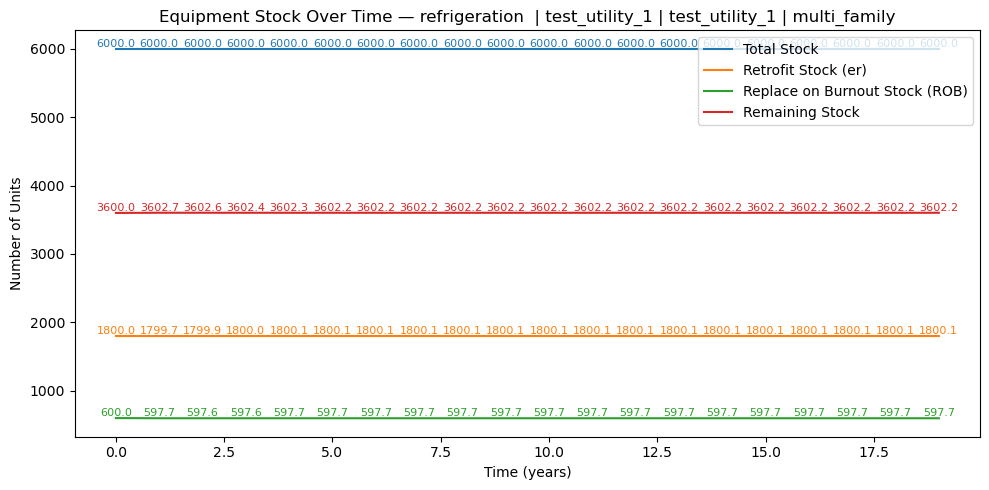

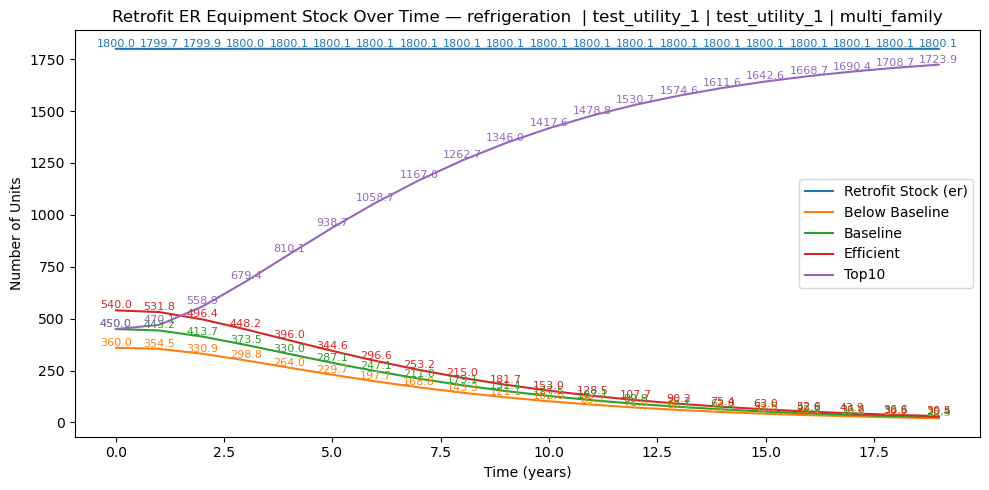

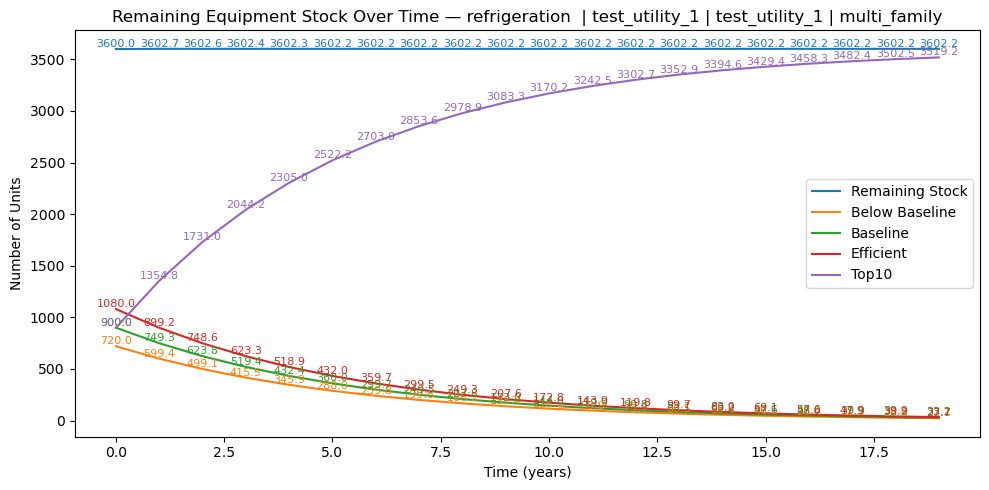

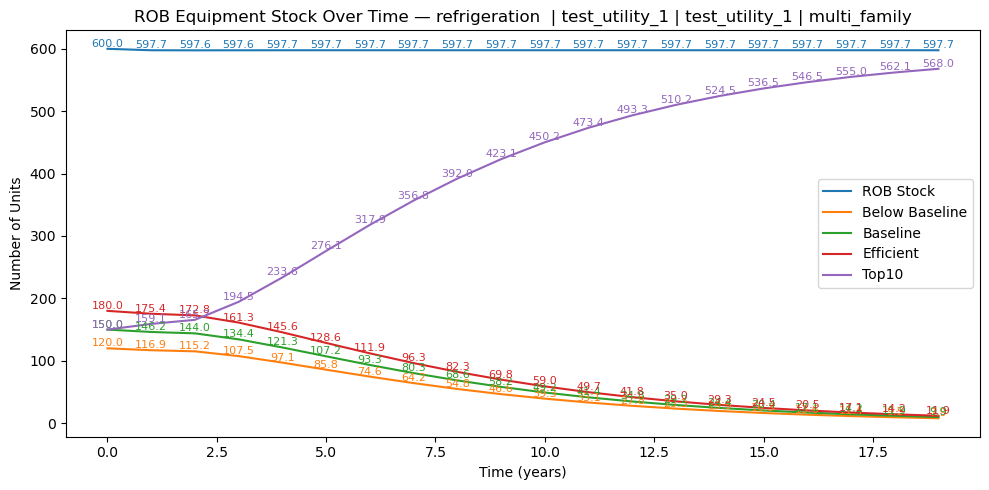

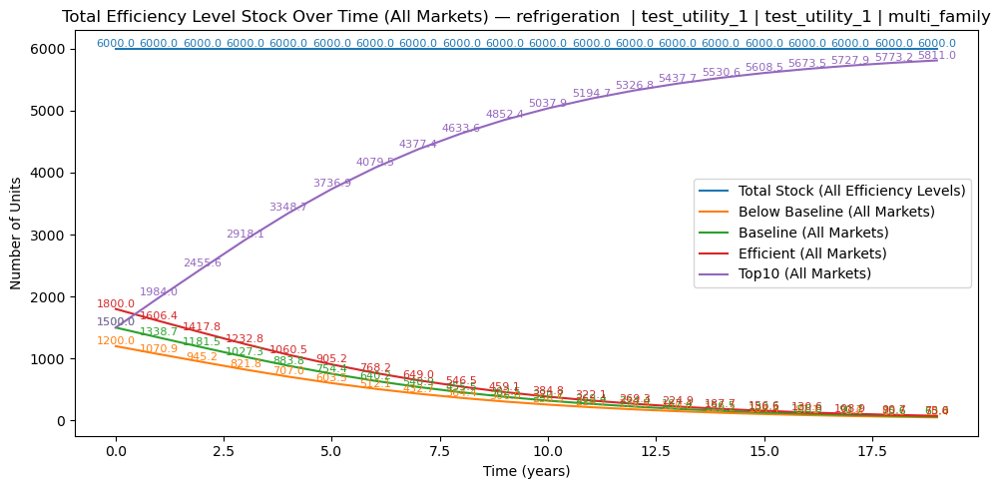

...

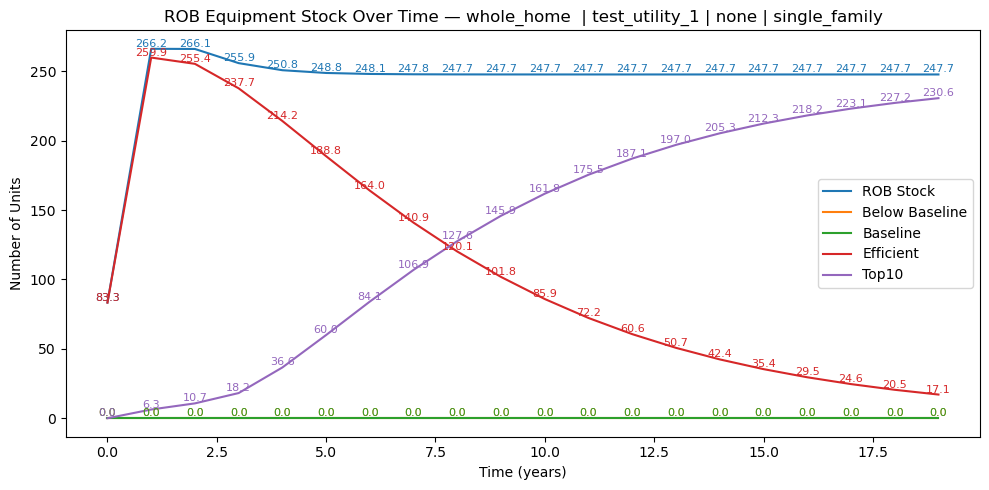

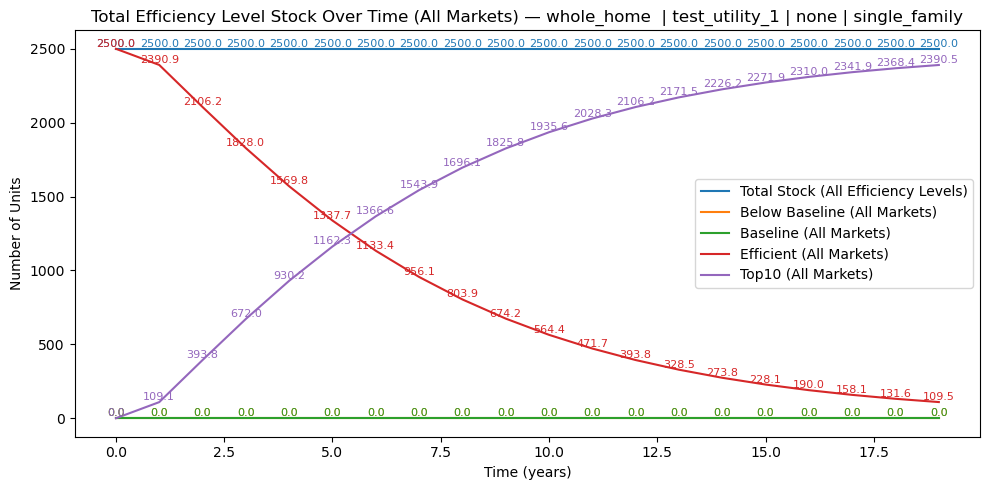

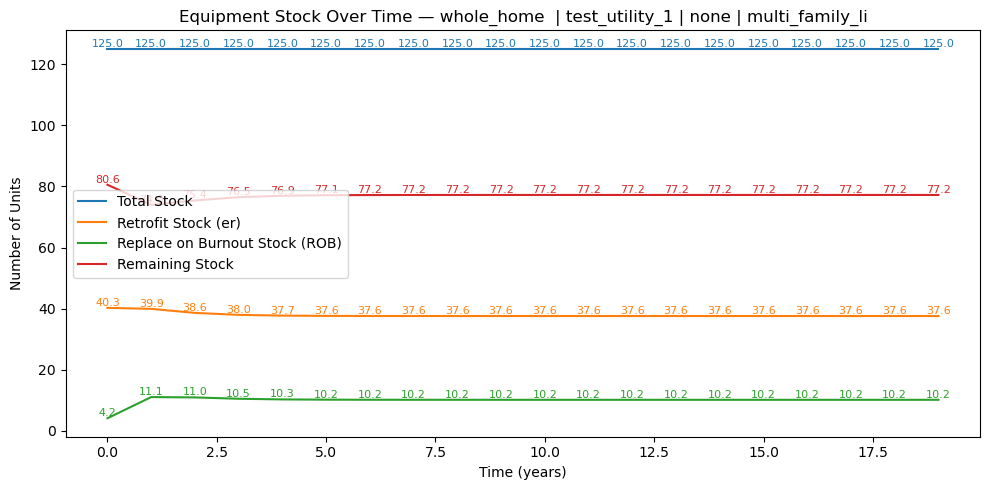

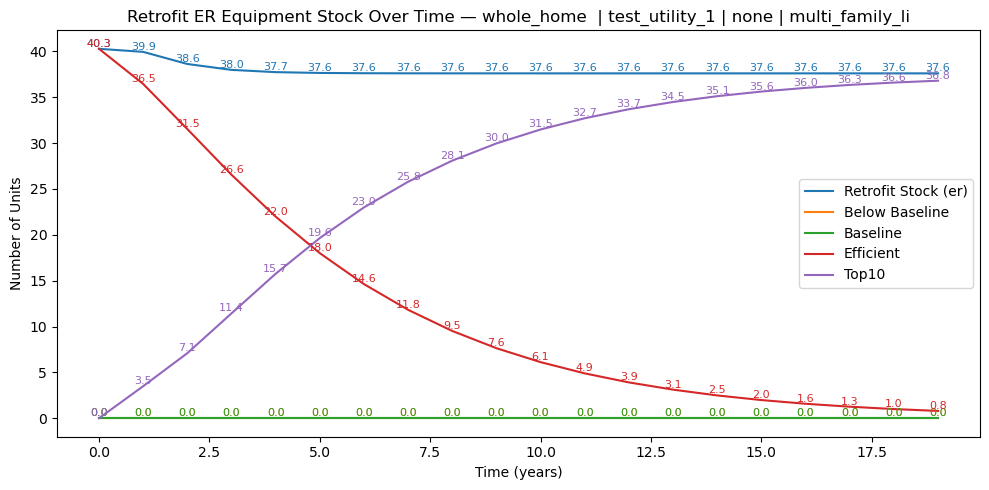

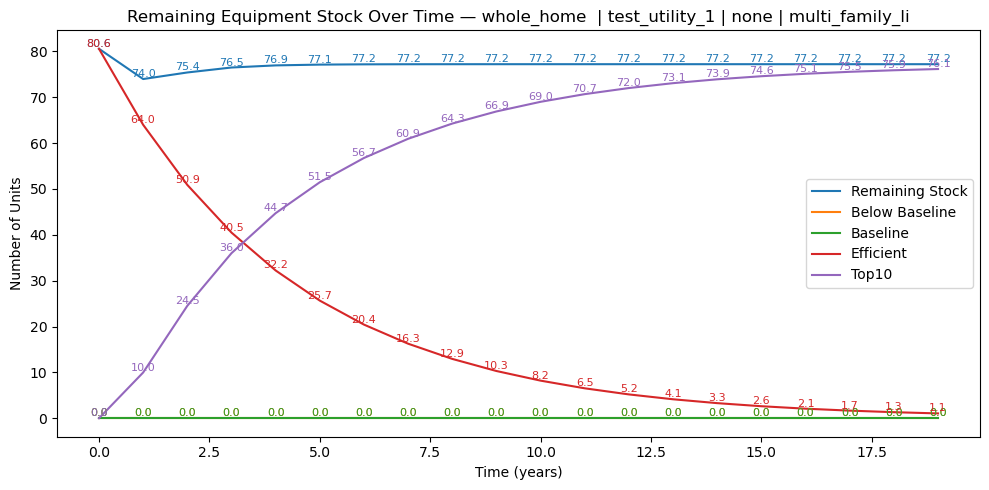

KeyboardInterrupt: 

In [298]:
# Plot results for each group combination
# import matplotlib.pyplot as plt

results_df = tech_results_df  # Change to tech_results_df to plot tech scenario

# Columns that define a group
group_cols = ['competition_group','electric_utility','gas_utility','building_type'] #'subgroup',
unique_groups = results_df[group_cols].drop_duplicates()

for _, g in unique_groups.iterrows():
    # Build mask for this group
    mask = (
        (results_df['competition_group'] == g['competition_group']) &
       # (results_df['subgroup'] == g['subgroup']) &
        (results_df['electric_utility'] == g['electric_utility']) &
        (results_df['gas_utility'] == g['gas_utility']) &
        (results_df['building_type'] == g['building_type'])
    )
    dfg = results_df[mask].sort_values('time')
    if dfg.empty:
        continue
    t = dfg['time'].values

    # Figure title suffix describing the group
    title_suffix = f"{g['competition_group']}  | {g['electric_utility']} | {g['gas_utility']} | {g['building_type']}" # | {g['subgroup']}

    # --- Plot 1: overall stocks ---
    plt.figure(figsize=(10, 5))
    plt.plot(t, dfg['total_stock'].values, label="Total Stock")
    plt.plot(t, dfg['ret_er_stock'].values, label="Retrofit Stock (er)")
    plt.plot(t, dfg['rob_stock'].values, label="Replace on Burnout Stock (ROB)")
    plt.plot(t, dfg['remaining_stock'].values, label="Remaining Stock")
    # global cumulative arrays (length n) — plot them against the same time vector
    # plt.plot(time, nc_cumulative_annual, label="Cumulative Annual New Construction (nc)")
    # plt.plot(time, -demo_cumulative_annual, label="Demolition (demo)")
    # plt.plot(time, reno_cumulative_annual, label="Renovation (Reno)")

    # Annotate every 10 timesteps (or fewer if short)
    #step = max(1, int(len(t)))#/20
    for i in range(0, len(t), 1):
        plt.text(t[i], dfg['total_stock'].values[i], f"{dfg['total_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:blue')
        plt.text(t[i], dfg['ret_er_stock'].values[i], f"{dfg['ret_er_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:orange')
        plt.text(t[i], dfg['rob_stock'].values[i], f"{dfg['rob_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:green')
        plt.text(t[i], dfg['remaining_stock'].values[i], f"{dfg['remaining_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:red')
        # plt.text(t[i], nc_cumulative_annual[i], f"{nc_cumulative_annual[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:purple')
        # plt.text(t[i], -demo_cumulative_annual[i], f"{-demo_cumulative_annual[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:brown')
        # plt.text(t[i], reno_cumulative_annual[i], f"{reno_cumulative_annual[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:brown')

    plt.xlabel("Time (years)")
    plt.ylabel("Number of Units")
    plt.title("Equipment Stock Over Time — " + title_suffix)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Plot 2: Retrofit ER breakdown ---
    plt.figure(figsize=(10, 5))
    plt.plot(t, dfg['ret_er_stock'].values, label="Retrofit Stock (er)")
    plt.plot(t, dfg['ret_er_below_baseline_stock'].values, label="Below Baseline")
    plt.plot(t, dfg['ret_er_baseline_stock'].values, label="Baseline")
    plt.plot(t, dfg['ret_er_efficient_stock'].values, label="Efficient")
    plt.plot(t, dfg['ret_er_top10_stock'].values, label="Top10")
    for i in range(0, len(t), 1):
        plt.text(t[i], dfg['ret_er_stock'].values[i], f"{dfg['ret_er_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:blue')
        plt.text(t[i], dfg['ret_er_below_baseline_stock'].values[i], f"{dfg['ret_er_below_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:orange')
        plt.text(t[i], dfg['ret_er_baseline_stock'].values[i], f"{dfg['ret_er_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:green')
        plt.text(t[i], dfg['ret_er_efficient_stock'].values[i], f"{dfg['ret_er_efficient_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:red')
        plt.text(t[i], dfg['ret_er_top10_stock'].values[i], f"{dfg['ret_er_top10_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:purple')
    plt.xlabel("Time (years)")
    plt.ylabel("Number of Units")
    plt.title("Retrofit ER Equipment Stock Over Time — " + title_suffix)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Plot 3: Remaining breakdown ---
    plt.figure(figsize=(10, 5))
    plt.plot(t, dfg['remaining_stock'].values, label="Remaining Stock")
    plt.plot(t, dfg['remaining_below_baseline_stock'].values, label="Below Baseline")
    plt.plot(t, dfg['remaining_baseline_stock'].values, label="Baseline")
    plt.plot(t, dfg['remaining_efficient_stock'].values, label="Efficient")
    plt.plot(t, dfg['remaining_top10_stock'].values, label="Top10")
    for i in range(0, len(t), 1):
        plt.text(t[i], dfg['remaining_stock'].values[i], f"{dfg['remaining_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:blue')
        plt.text(t[i], dfg['remaining_below_baseline_stock'].values[i], f"{dfg['remaining_below_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:orange')
        plt.text(t[i], dfg['remaining_baseline_stock'].values[i], f"{dfg['remaining_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:green')
        plt.text(t[i], dfg['remaining_efficient_stock'].values[i], f"{dfg['remaining_efficient_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:red')
        plt.text(t[i], dfg['remaining_top10_stock'].values[i], f"{dfg['remaining_top10_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:purple')
    plt.xlabel("Time (years)")
    plt.ylabel("Number of Units")
    plt.title("Remaining Equipment Stock Over Time — " + title_suffix)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Plot 4: ROB breakdown ---
    plt.figure(figsize=(10, 5))
    plt.plot(t, dfg['rob_stock'].values, label="ROB Stock")
    plt.plot(t, dfg['rob_below_baseline_stock'].values, label="Below Baseline")
    plt.plot(t, dfg['rob_baseline_stock'].values, label="Baseline")
    plt.plot(t, dfg['rob_efficient_stock'].values, label="Efficient")
    plt.plot(t, dfg['rob_top10_stock'].values, label="Top10")
    for i in range(0, len(t), 1): #change here for annotation
        plt.text(t[i], dfg['rob_stock'].values[i], f"{dfg['rob_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:blue')
        plt.text(t[i], dfg['rob_below_baseline_stock'].values[i], f"{dfg['rob_below_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:orange')
        plt.text(t[i], dfg['rob_baseline_stock'].values[i], f"{dfg['rob_baseline_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:green')
        plt.text(t[i], dfg['rob_efficient_stock'].values[i], f"{dfg['rob_efficient_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:red')
        plt.text(t[i], dfg['rob_top10_stock'].values[i], f"{dfg['rob_top10_stock'].values[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:purple')
    plt.xlabel("Time (years)")
    plt.ylabel("Number of Units")
    plt.title("ROB Equipment Stock Over Time — " + title_suffix)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Plot 5: Total Efficiency Level breakdown (summed across all markets) ---
    plt.figure(figsize=(10, 5))
    total_below_baseline = dfg['rob_below_baseline_stock'].values + dfg['ret_er_below_baseline_stock'].values + dfg['remaining_below_baseline_stock'].values
    total_baseline = dfg['rob_baseline_stock'].values + dfg['ret_er_baseline_stock'].values + dfg['remaining_baseline_stock'].values
    total_efficient = dfg['rob_efficient_stock'].values + dfg['ret_er_efficient_stock'].values + dfg['remaining_efficient_stock'].values
    total_top10 = dfg['rob_top10_stock'].values + dfg['ret_er_top10_stock'].values + dfg['remaining_top10_stock'].values
    total_all_efficiency = total_below_baseline + total_baseline + total_efficient + total_top10

    plt.plot(t, total_all_efficiency, label="Total Stock (All Efficiency Levels)")
    plt.plot(t, total_below_baseline, label="Below Baseline (All Markets)")
    plt.plot(t, total_baseline, label="Baseline (All Markets)")
    plt.plot(t, total_efficient, label="Efficient (All Markets)")
    plt.plot(t, total_top10, label="Top10 (All Markets)")
    for i in range(0, len(t), 1):
        plt.text(t[i], total_all_efficiency[i], f"{total_all_efficiency[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:blue')
        plt.text(t[i], total_below_baseline[i], f"{total_below_baseline[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:orange')
        plt.text(t[i], total_baseline[i], f"{total_baseline[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:green')
        plt.text(t[i], total_efficient[i], f"{total_efficient[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:red')
        plt.text(t[i], total_top10[i], f"{total_top10[i]:.1f}", fontsize=8, ha='center', va='bottom', color='tab:purple')
    plt.xlabel("Time (years)")
    plt.ylabel("Number of Units")
    plt.title("Total Efficiency Level Stock Over Time (All Markets) — " + title_suffix)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Done plotting all groups
print(f"Plotted {len(unique_groups)} group combinations.")